In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from types import SimpleNamespace
from sklearn.datasets import make_swiss_roll
from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding, MDS
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import kneighbors_graph
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances, roc_auc_score, accuracy_score
from gensim.models import Word2Vec


# Function to plot the graph with edges
def plot_graph_with_edges(X, knn_graph, ax):
    ax.scatter(*X.T, c=np.arange(n_samples), cmap='Blues', s=15)

    # Plot the edges based on the KNN graph
    for i in range(X.shape[0]):
        for j in range(i + 1, X.shape[0]):
            if knn_graph[i, j] == 1:  # If there is an edge between node i and j
                ax.plot(*X[[i, j]].T, 'k-', lw=0.1)

class DeepWalk:
    def __init__(self, n_components, walks, walk_length):
        self.walks = walks
        self.walk_length = walk_length
    
    def fit_transform(self, knn_graph):
        # Convert adjacency matrix to NetworkX graph
        G = nx.from_numpy_array(knn_graph)
        # Generate random walks from the graph
        walks = list(nx.generate_random_paths(G, self.walks, self.walk_length))

        # Convert walks to strings since Word2Vec expects string input
        walks = [[str(node) for node in walk] for walk in walks]

        # Train Word2Vec model (DeepWalk embeddings)
        model = Word2Vec(walks, vector_size=64, window=5, min_count=1, sg=1, workers=4)

        # Get embeddings for all nodes as a matrix
        return np.array([model.wv[str(node)] for node in G.nodes()])

## Generate Synthetic Data (Swiss Roll)

Text(0.5, 0.92, '3D Swiss Roll with KNN Graph')

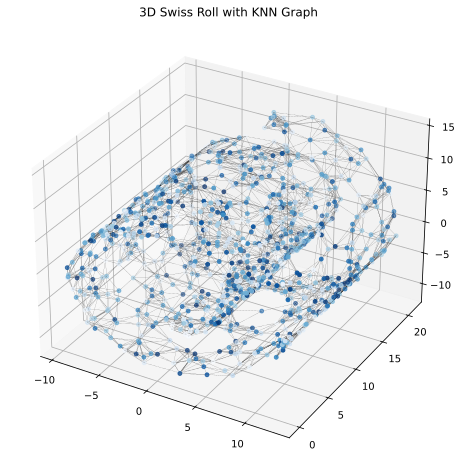

In [2]:
n_samples = 1000
G, _ = make_swiss_roll(n_samples, noise=0.1)
X = pairwise_distances(G)

# K-Nearest Neighbors graph
n_neighbors = 10
knn_graph = kneighbors_graph(G, n_neighbors=n_neighbors, mode='connectivity').toarray()

# Plot the connected Swiss Roll in 3D with edges
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
plot_graph_with_edges(G, knn_graph, ax)
ax.set_title('3D Swiss Roll with KNN Graph')

## Compute embeddings

In [3]:
n_components = 2

embeddings = SimpleNamespace(
	isomap = SimpleNamespace(
		name = "Isomap Embedding",
		x = Isomap(n_neighbors=n_neighbors, n_components=n_components).fit_transform(X)
	),

	lle = SimpleNamespace(
		name = "Locally Linear Embedding", 
		x = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=n_components, method='standard').fit_transform(X)
	),

	le = SimpleNamespace(
		name = "Laplacian Eigenmaps",
		x = SpectralEmbedding(n_neighbors=n_neighbors, n_components=n_components).fit_transform(X)
	),

	pca = SimpleNamespace(
		name = "Locality Preserving Projections (PCA)",
		x = PCA(n_components=n_components).fit_transform(X)
	),

	mds = SimpleNamespace(
		name = "Multi-Dimensional Scaling",
		x = MDS(n_components=n_components, dissimilarity='precomputed').fit_transform(X)
	),

	dw = SimpleNamespace(
		name = "DeepWalk",
		x = DeepWalk(n_components=n_components, walks=10**4, walk_length=10).fit_transform(knn_graph)
	)
)

## Visualize the Graphs with Edges in Low-dimensional space

In [4]:
fig, axs = plt.subplots(2, 3, figsize=(30, 12))

# Isomap
plot_graph_with_edges(embeddings.isomap.x, knn_graph, axs[0, 0])
axs[0, 0].set_title(embeddings.isomap.name)

# LLE
plot_graph_with_edges(embeddings.lle.x, knn_graph, axs[0, 1])
axs[0, 1].set_title(embeddings.lle.name)

# Laplacian Eigenmaps
plot_graph_with_edges(embeddings.le.x, knn_graph, axs[0, 2])
axs[0, 2].set_title(embeddings.le.name)

# LPP (PCA approximation)
plot_graph_with_edges(embeddings.pca.x, knn_graph, axs[1, 0])
axs[1, 0].set_title(embeddings.pca.name)

# MDS
plot_graph_with_edges(embeddings.mds.x, knn_graph, axs[1, 1])
axs[1, 1].set_title(embeddings.mds.name)

# DeepWalk
dw_pca = PCA(n_components=n_components).fit_transform(embeddings.dw.x)
plot_graph_with_edges(dw_pca, knn_graph, axs[1, 2])
axs[1, 2].set_title("Projected " + embeddings.dw.name)


plt.tight_layout()
plt.show()


## Quality metrics

In [5]:
from imblearn.over_sampling import SMOTE

def reconstruction_error(X, X_embedded):
    # Compute pairwise distances in the original and embedded space
    distance_embedded = pairwise_distances(X_embedded)
    # Calculate the reconstruction error as the Frobenius norm between distance matrices
    return np.linalg.norm(X - distance_embedded) / np.linalg.norm(X)

def neighborhood_preservation(knn_graph, X_embedded, n_neighbors=10):
    neighbors_embedded = kneighbors_graph(X_embedded, n_neighbors=n_neighbors, mode='connectivity').toarray()
    # Calculate neighborhood overlap (how many neighbors are preserved in the embedding)
    return  np.sum(np.logical_and(knn_graph, neighbors_embedded)) / np.sum(knn_graph)

def embedded_dataset(X_embedded, knn_graph, test_size=0.3):
    x = []; y = []

    for i in range(n_samples):
        for j in range(i + 1, n_samples):
            x.append(X_embedded[i] * X_embedded[j])
            y.append(knn_graph[i, j])

    x_balanced, y_balanced = SMOTE(random_state=42).fit_resample(np.array(x), np.array(y))

    return train_test_split(
        x_balanced,
        y_balanced,
        test_size=test_size,
        random_state=42
    )

def LinkPredictor(x, y):
    log_reg = LogisticRegression()
    log_reg.fit(x, y)
    return log_reg

def compute_metrics(X, X_embedded, knn_graph):
    x_train, x_test, y_train, y_test = embedded_dataset(X_embedded, knn_graph)
    model = LinkPredictor(x_train, y_train)
    y_pred = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)[:, 1]
    return dict(
        accuracy = accuracy_score(y_test, y_pred),
        auc_score = roc_auc_score(y_test, y_pred_proba),
        reconstruction_error = reconstruction_error(X, X_embedded),
        neighborhood_preservation = neighborhood_preservation(knn_graph, X_embedded)
    )

In [6]:
from pandas import DataFrame
metrics = DataFrame({
	embeddings.isomap.name: compute_metrics(X, embeddings.isomap.x, knn_graph),
	embeddings.lle.name: compute_metrics(X, embeddings.lle.x, knn_graph),
	embeddings.le.name: compute_metrics(X, embeddings.le.x, knn_graph),
	embeddings.pca.name: compute_metrics(X, embeddings.pca.x, knn_graph),
	embeddings.mds.name: compute_metrics(X, embeddings.mds.x, knn_graph),
	embeddings.dw.name: compute_metrics(X, embeddings.dw.x, knn_graph),
})
metrics

,Isomap Embedding,Locally Linear Embedding,Laplacian Eigenmaps,Locality Preserving Projections (PCA),Multi-Dimensional Scaling,DeepWalk
accuracy,0.757598,0.724816,0.500099,0.783306,0.752573,0.994877
auc_score,0.849548,0.860469,0.500000,0.880219,0.862614,0.998867
reconstruction_error,36.662964,0.996588,0.998832,11.230132,0.206035,0.755360
neighborhood_preservation,0.862200,0.430200,0.365700,0.421600,0.515100,0.867100


In [7]:
len(embedded_dataset(embeddings.isomap.x, knn_graph)[3])

296685